Inputs shape: (1500, 256, 256, 1), Targets shape: (1500, 256, 256, 1)
Dataset created.


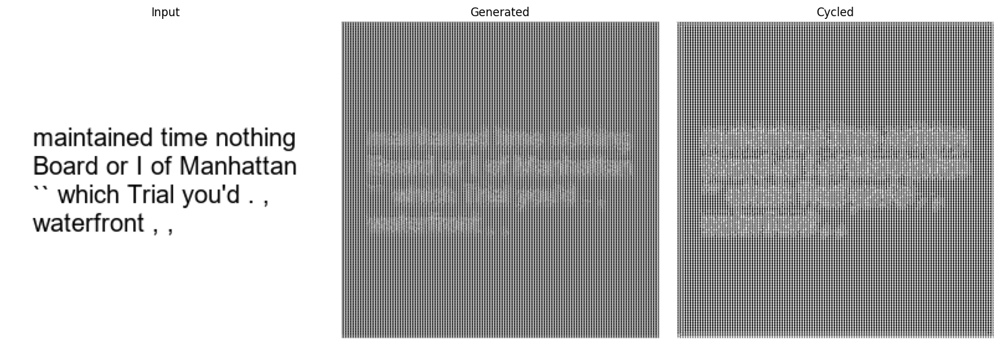

Epoch 1/100 completed.


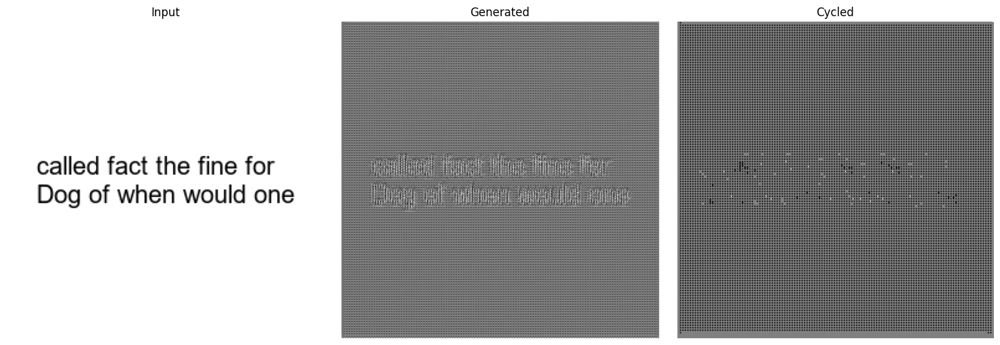

Epoch 2/100 completed.


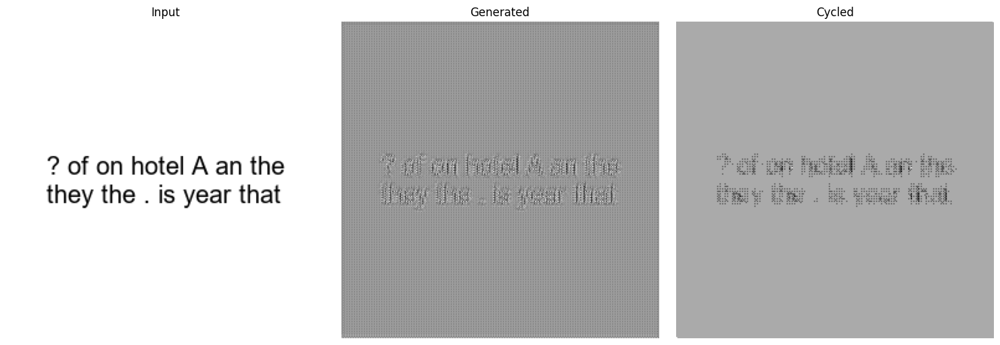

Epoch 3/100 completed.


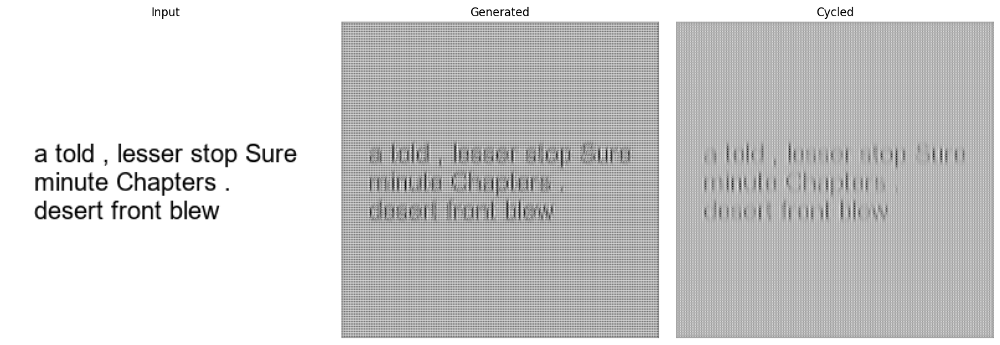

Epoch 4/100 completed.


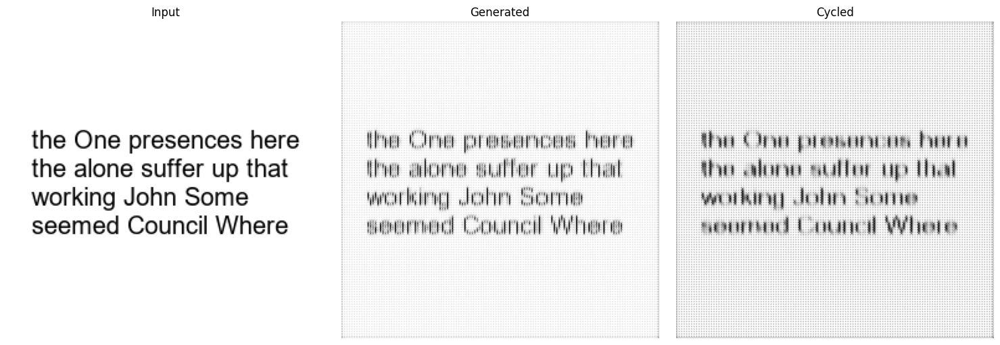

Epoch 5/100 completed.


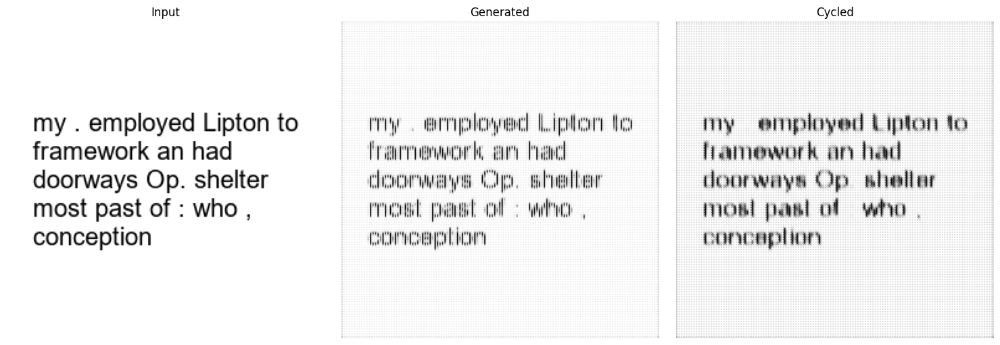

Epoch 6/100 completed.


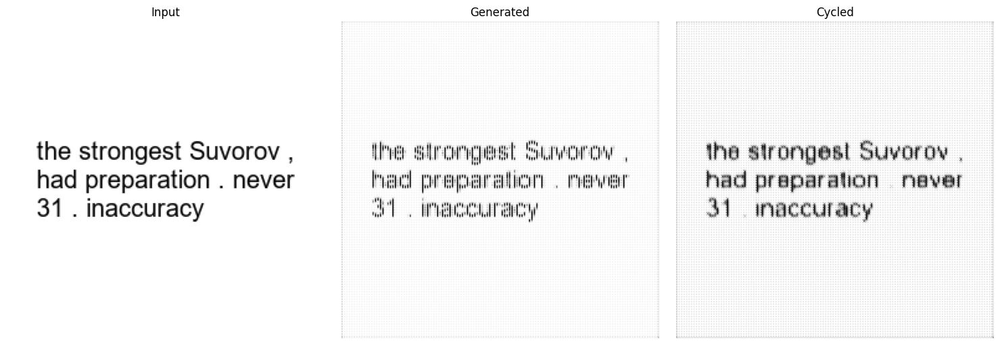

Epoch 7/100 completed.


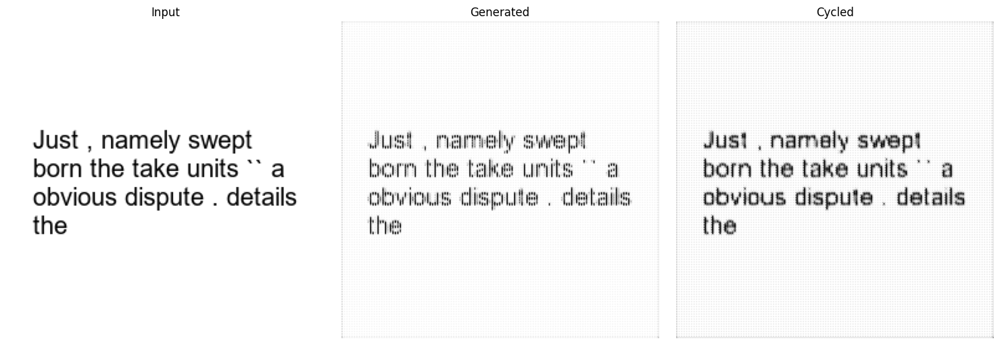

Epoch 8/100 completed.


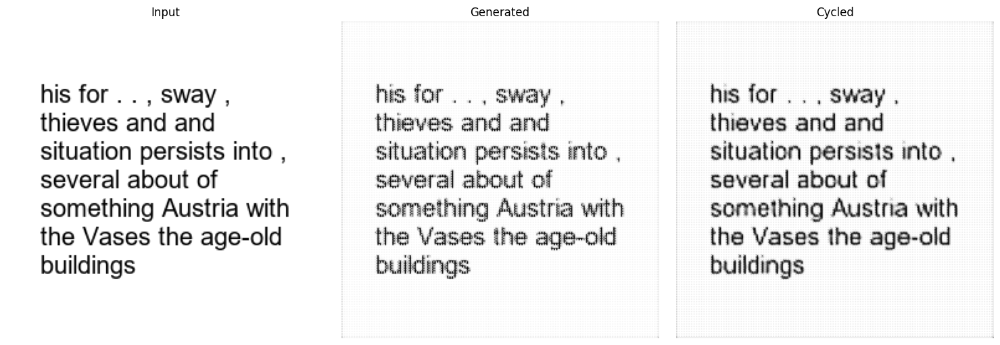

Epoch 9/100 completed.


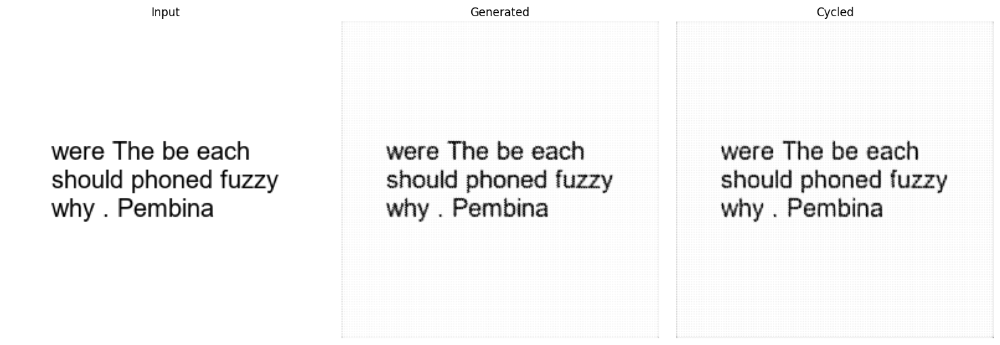

Epoch 10/100 completed.


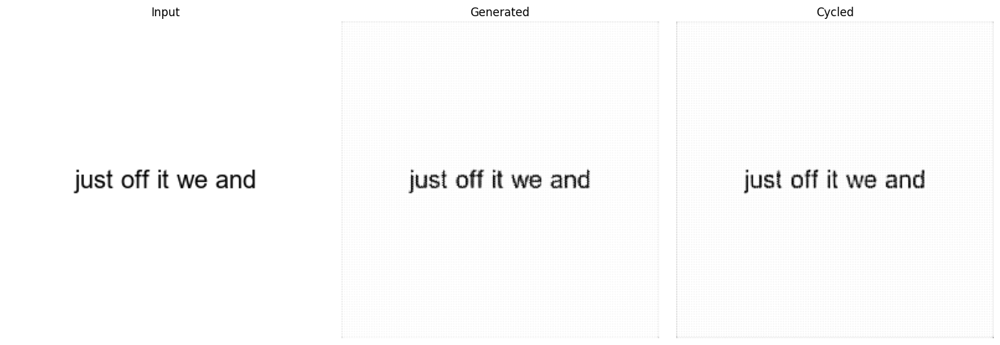

Epoch 11/100 completed.


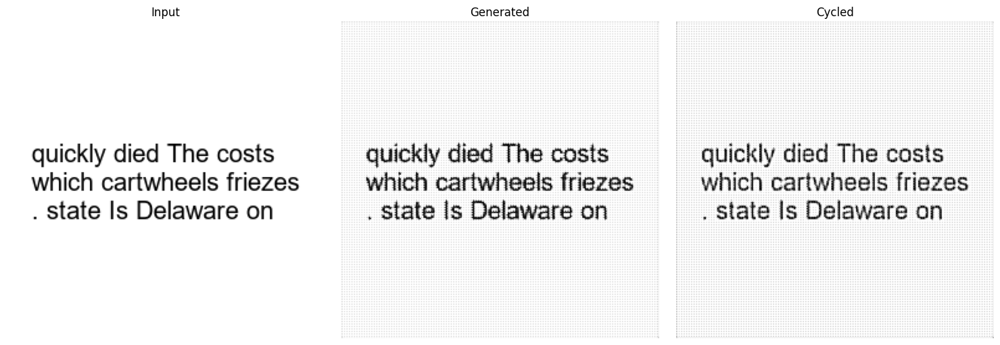

Epoch 12/100 completed.


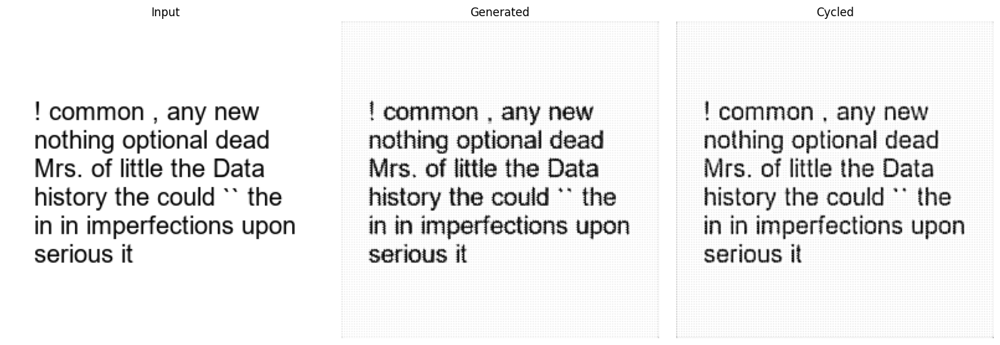

Epoch 13/100 completed.


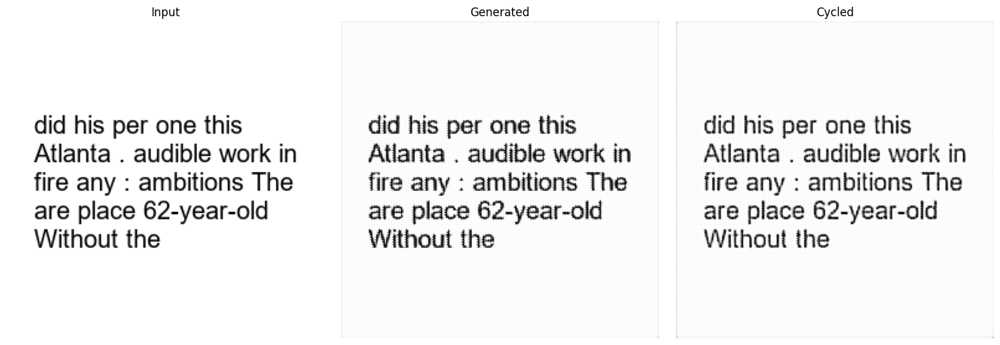

Epoch 14/100 completed.


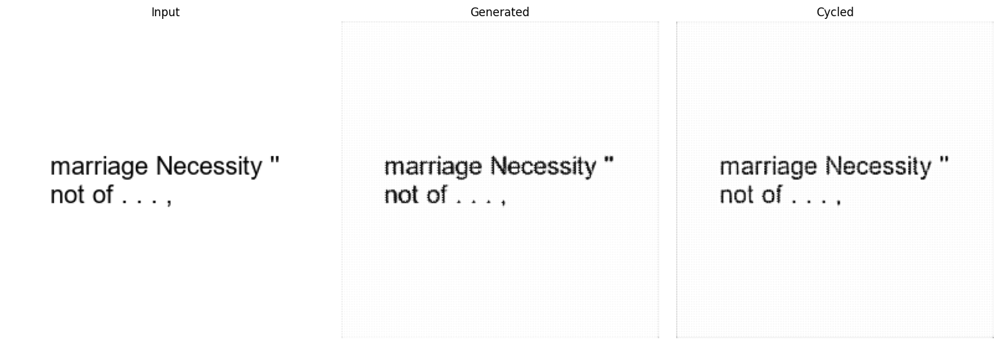

Epoch 15/100 completed.


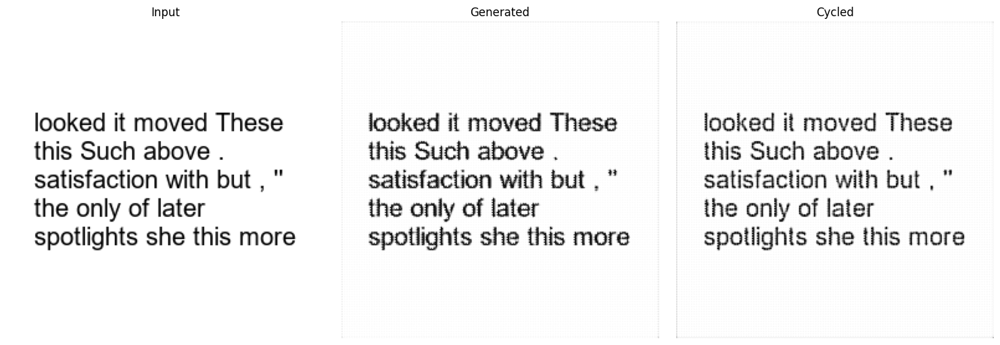

Epoch 16/100 completed.


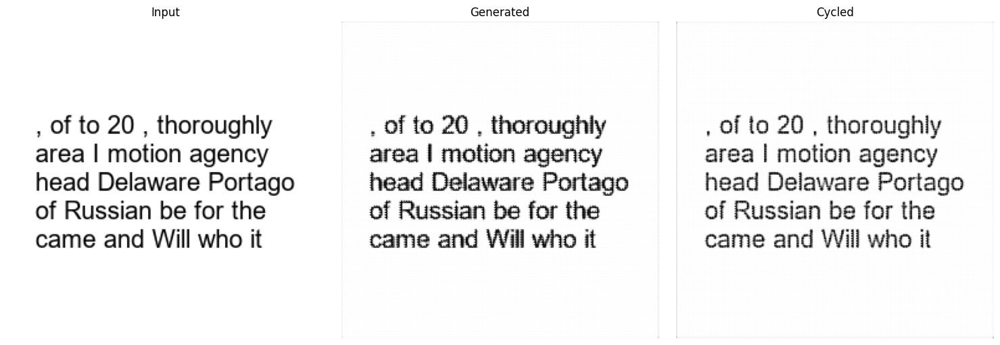

Epoch 17/100 completed.


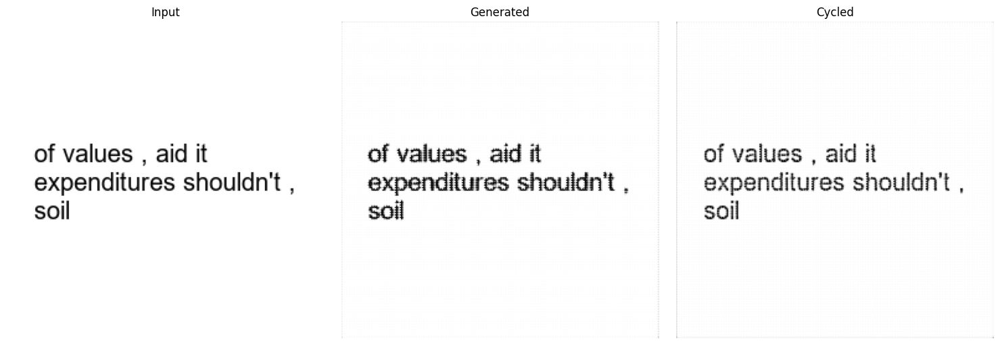

Epoch 18/100 completed.


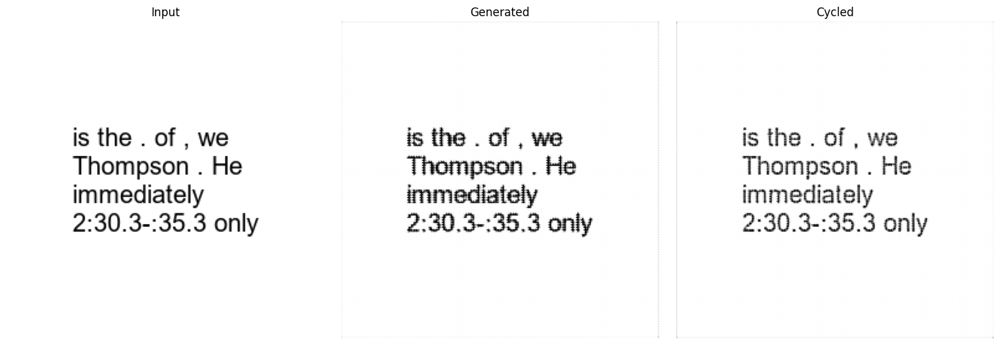

Epoch 19/100 completed.


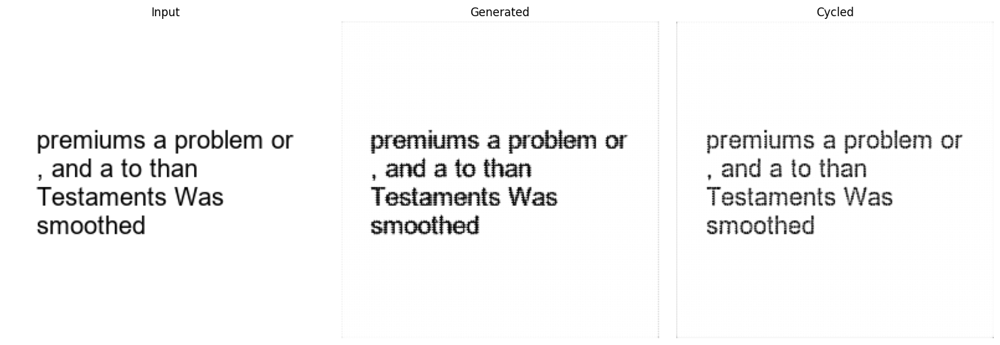

Epoch 20/100 completed.


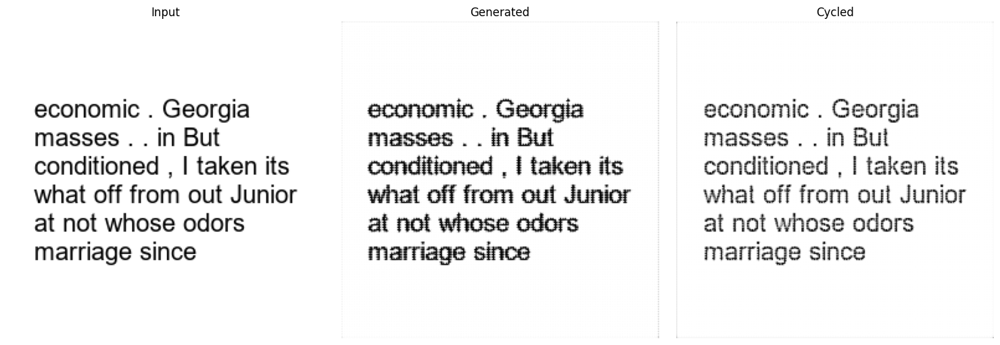

Epoch 21/100 completed.


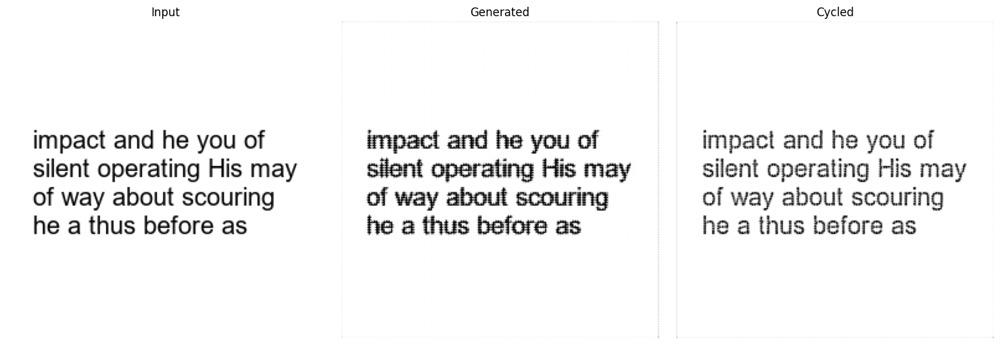

Epoch 22/100 completed.


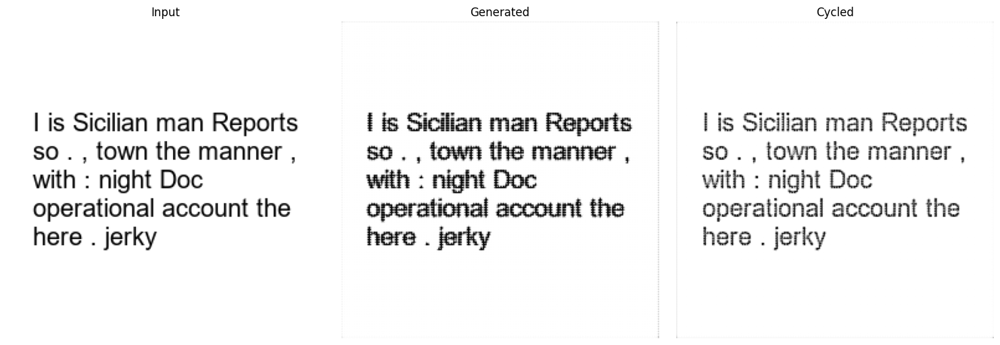

Epoch 23/100 completed.


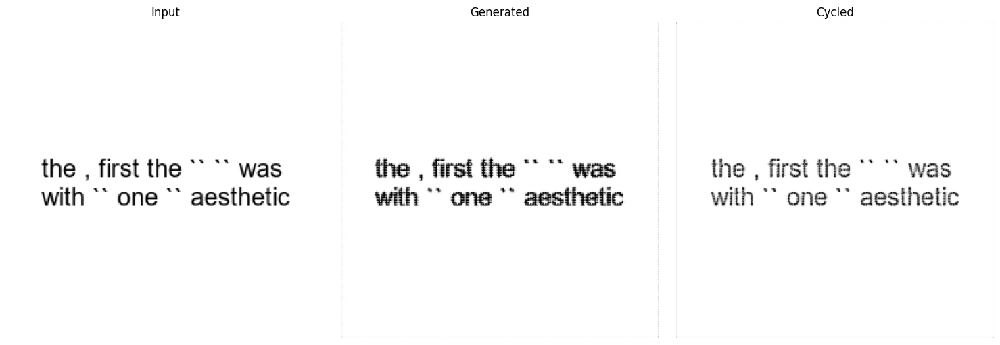

Epoch 24/100 completed.


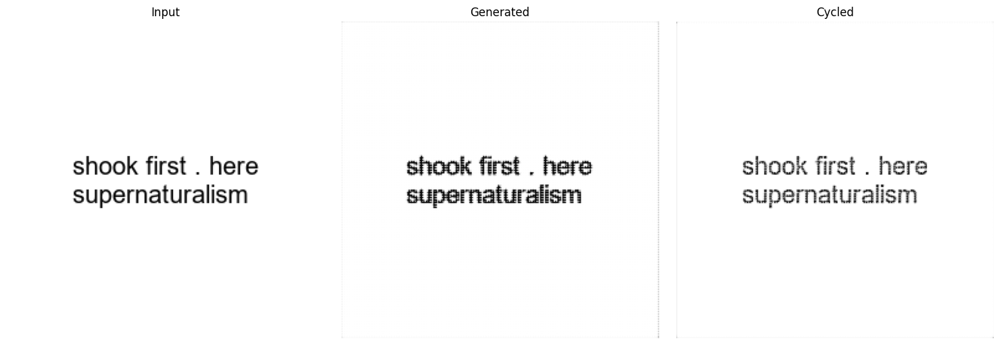

Epoch 25/100 completed.


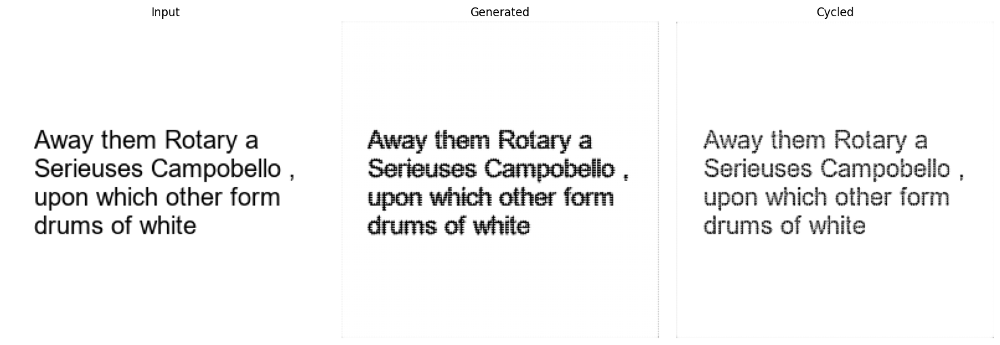

Epoch 26/100 completed.


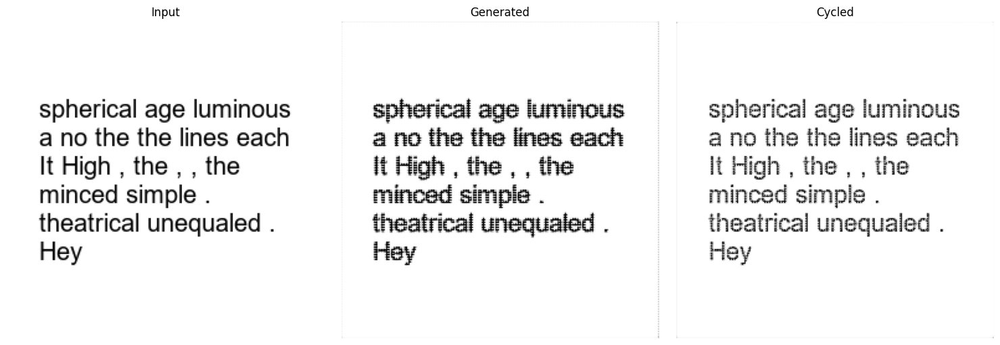

Epoch 27/100 completed.


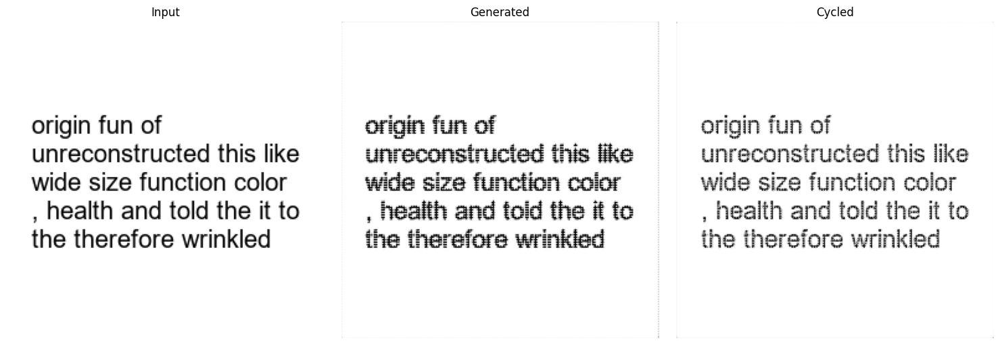

Epoch 28/100 completed.


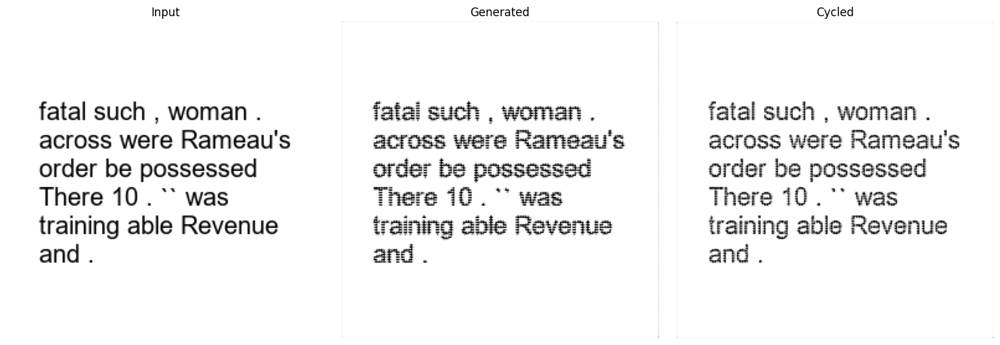

Epoch 29/100 completed.


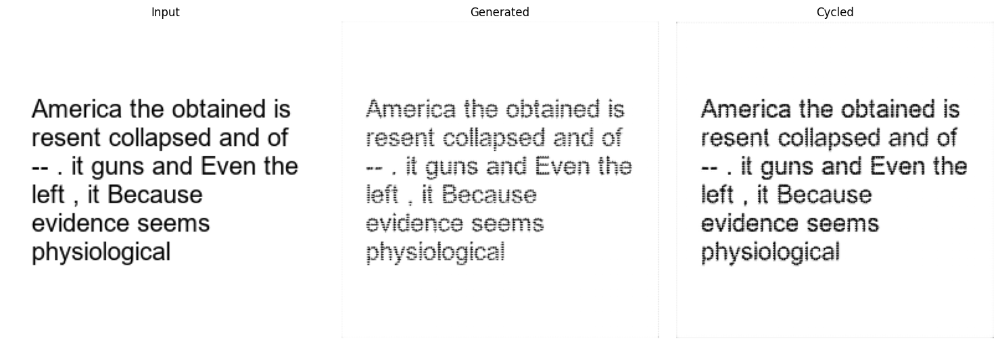

Epoch 30/100 completed.


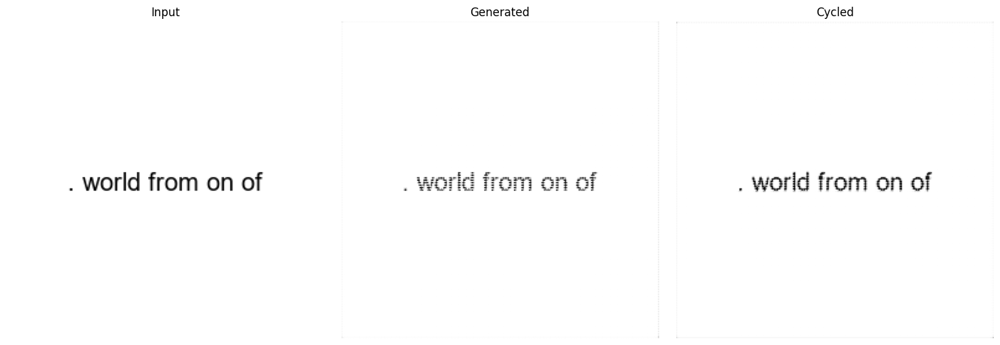

Epoch 31/100 completed.


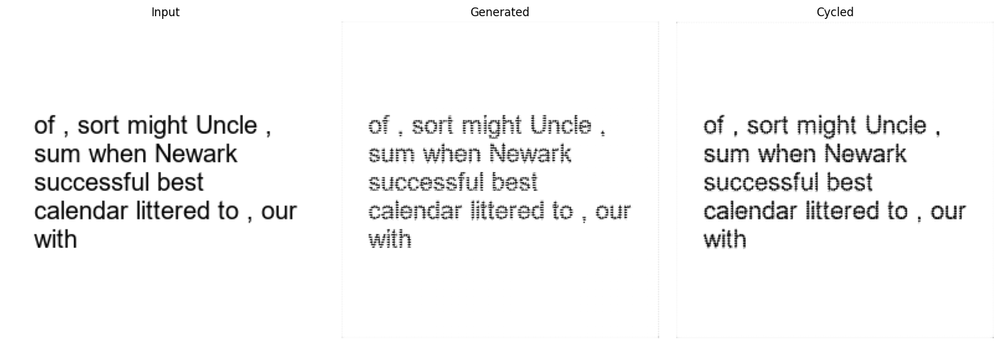

Epoch 32/100 completed.


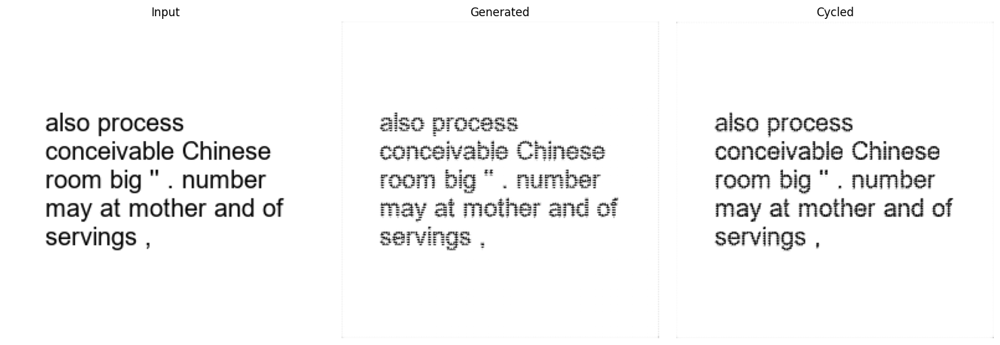

Epoch 33/100 completed.


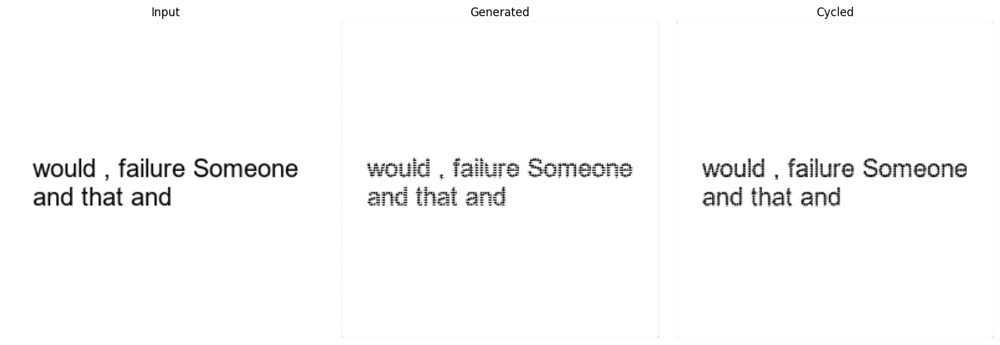

Epoch 34/100 completed.


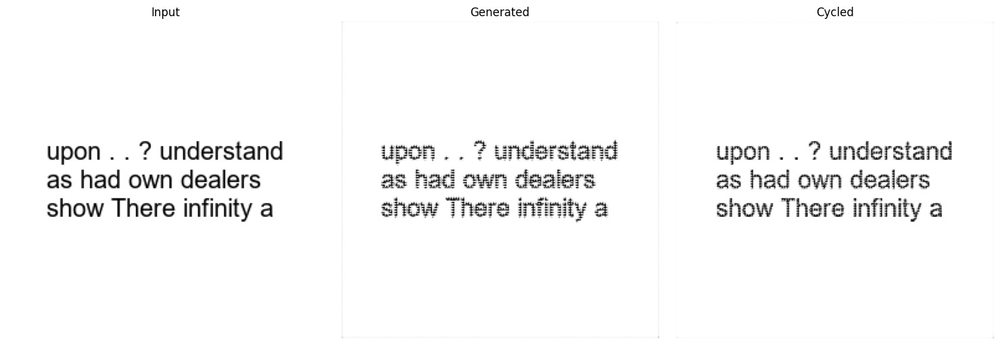

Epoch 35/100 completed.


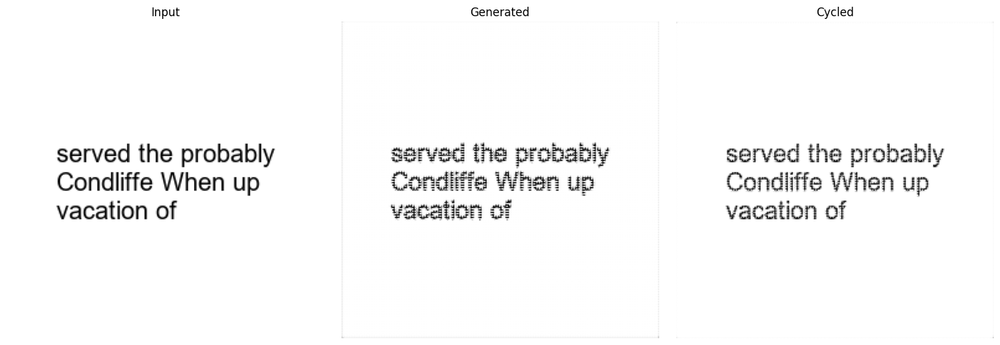

Epoch 36/100 completed.


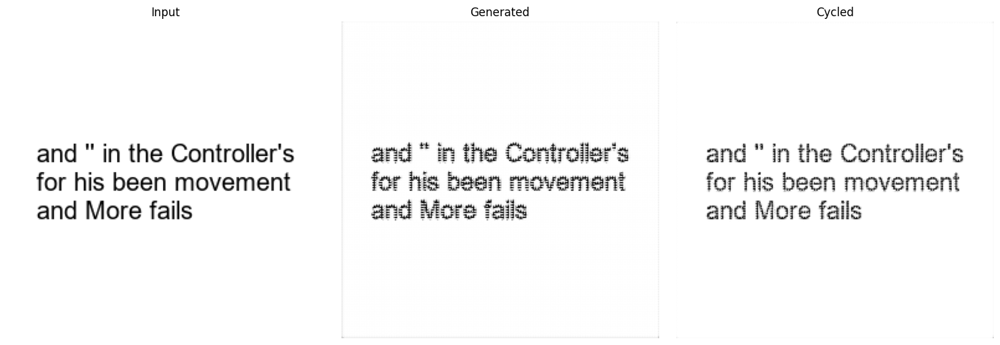

Epoch 37/100 completed.


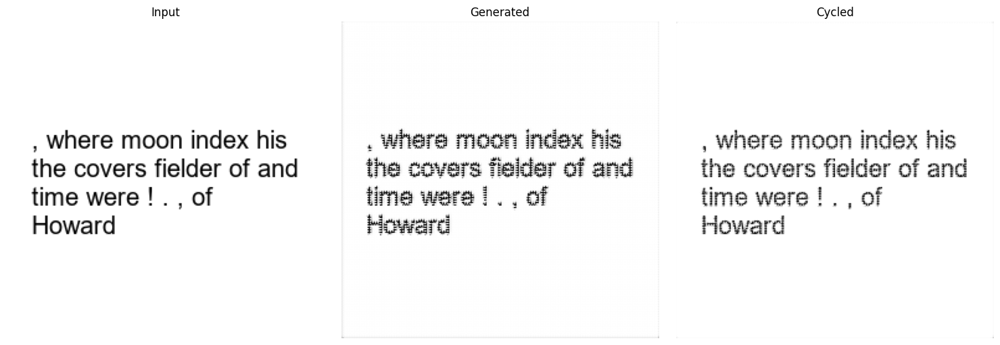

Epoch 38/100 completed.


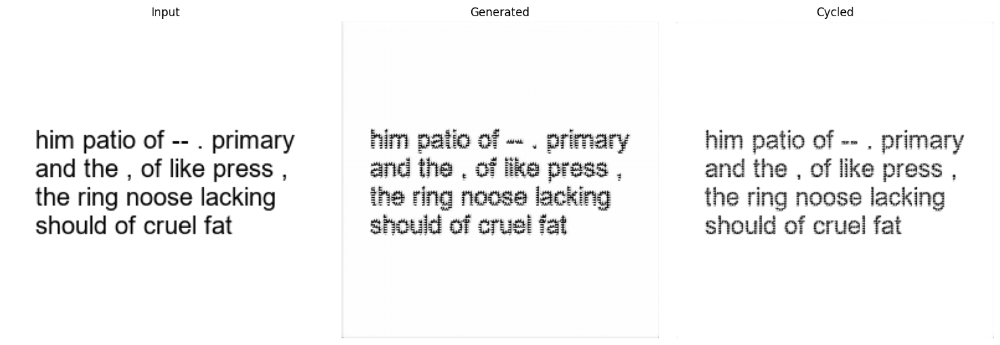

Epoch 39/100 completed.


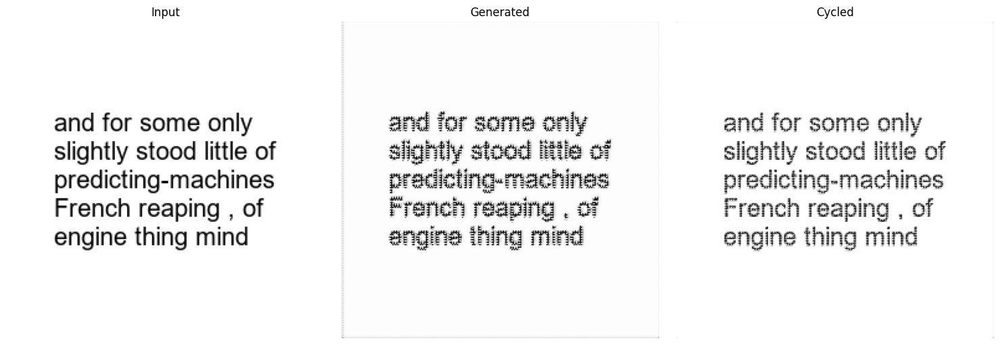

Epoch 40/100 completed.


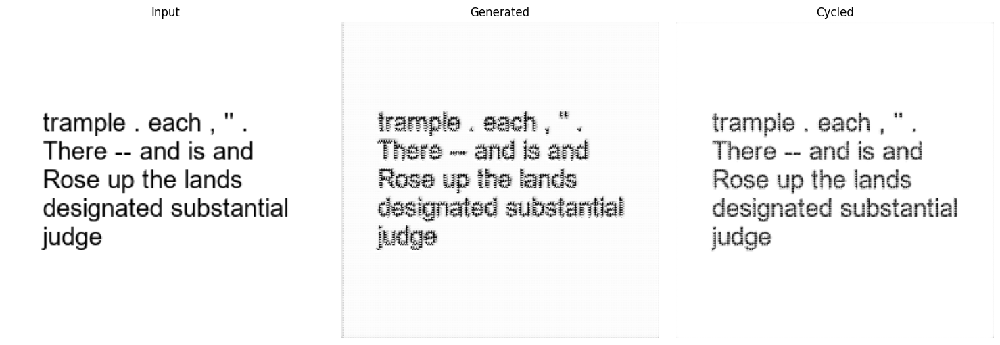

Epoch 41/100 completed.


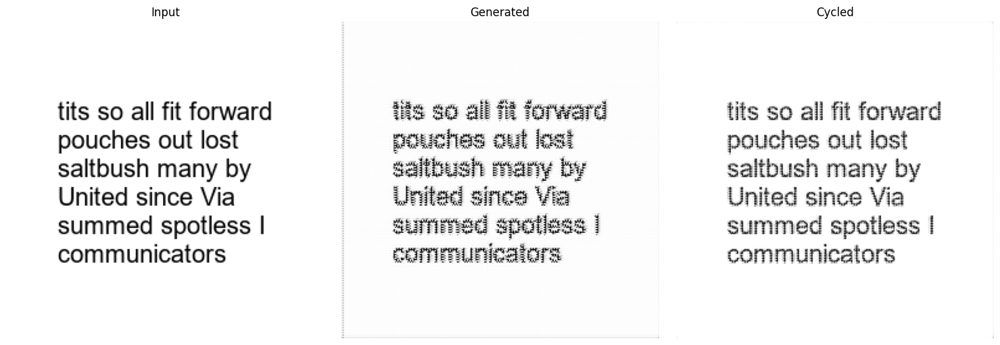

Epoch 42/100 completed.


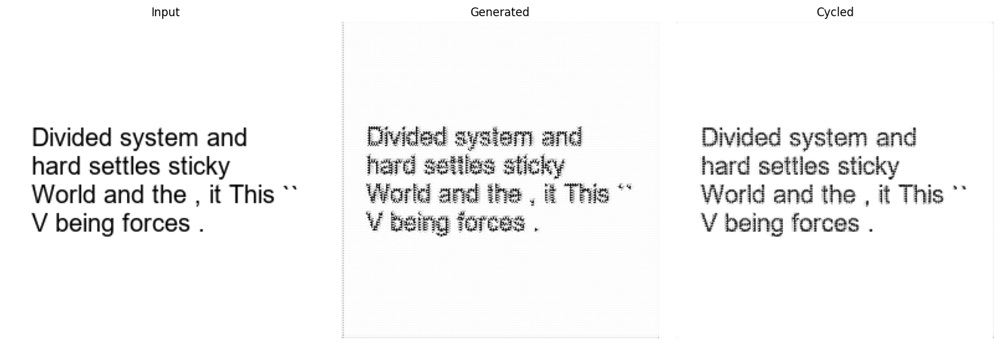

Epoch 43/100 completed.


In [ ]:
import os
import numpy as np
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers, Model

# Load and preprocess the data
def load_data(data_dir, img_size=(256, 256)):
    inputs = []
    targets = []
    for filename in os.listdir(data_dir):
        if "_input_" in filename:
            target_filename = filename.replace("_input_", "_target_")
            input_path = os.path.join(data_dir, filename)
            target_path = os.path.join(data_dir, target_filename)

            if not os.path.exists(target_path):
                print(f"Warning: Target file not found for {filename}. Skipping.")
                continue

            # Load, convert to grayscale, resize, and normalize
            input_img = Image.open(input_path).convert('L').resize(img_size)
            target_img = Image.open(target_path).convert('L').resize(img_size)

            # Normalize to [-1, 1] and add channel dimension
            inputs.append(np.expand_dims(np.array(input_img) / 127.5 - 1, axis=-1))
            targets.append(np.expand_dims(np.array(target_img) / 127.5 - 1, axis=-1))

    return np.array(inputs, dtype=np.float32), np.array(targets, dtype=np.float32)

# Directory containing the data
data_dir = "/kaggle/input/calibritoarial/font_transfer_dataset/pairs"
inputs, targets = load_data(data_dir)
print(f"Inputs shape: {inputs.shape}, Targets shape: {targets.shape}")

batch_size = 10

# Create TensorFlow dataset
def create_tf_dataset(inputs, targets, batch_size):
    dataset = tf.data.Dataset.from_tensor_slices((inputs, targets))
    dataset = dataset.shuffle(buffer_size=len(inputs)).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset


dataset = create_tf_dataset(inputs, targets, batch_size)
print("Dataset created.")

# Build generator model
def build_generator(input_shape=(256, 256, 1)):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (3, 3), strides=1, padding="same", activation="relu")(inputs)
    x = layers.Conv2D(128, (3, 3), strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2DTranspose(64, (3, 3), strides=2, padding="same", activation="relu")(x)
    outputs = layers.Conv2D(1, (3, 3), padding="same", activation="tanh")(x)
    return Model(inputs, outputs)

# Build discriminator model
def build_discriminator(input_shape=(256, 256, 1)):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (4, 4), strides=2, padding="same", activation="relu")(inputs)
    x = layers.Conv2D(128, (4, 4), strides=2, padding="same", activation="relu")(x)
    x = layers.Flatten()(x)
    outputs = layers.Dense(1, activation="sigmoid")(x)
    return Model(inputs, outputs)

# Create models
gen_g = build_generator()
gen_f = build_generator()
disc_font1 = build_discriminator()
disc_font2 = build_discriminator()

# Loss functions
def adversarial_loss(real, generated):
    return tf.reduce_mean(tf.square(real - 1)) + tf.reduce_mean(tf.square(generated))

def cycle_consistency_loss(real_image, cycled_image):
    return tf.reduce_mean(tf.abs(real_image - cycled_image))

def identity_loss(real_image, same_image):
    return tf.reduce_mean(tf.abs(real_image - same_image))

# Optimizers
gen_g_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.5)
gen_f_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.5)
disc_font1_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.5)
disc_font2_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.5)

# Training step
@tf.function
def train_step(real_font1, real_font2):
    with tf.GradientTape(persistent=True) as tape:
        # Font1 -> Font2 -> Font1
        fake_font2 = gen_g(real_font1, training=True)
        cycled_font1 = gen_f(fake_font2, training=True)

        # Font2 -> Font1 -> Font2
        fake_font1 = gen_f(real_font2, training=True)
        cycled_font2 = gen_g(fake_font1, training=True)

        # Discriminators
        disc_real_font1 = disc_font1(real_font1, training=True)
        disc_fake_font1 = disc_font1(fake_font1, training=True)
        disc_real_font2 = disc_font2(real_font2, training=True)
        disc_fake_font2 = disc_font2(fake_font2, training=True)

        # Generator losses
        gen_g_loss = adversarial_loss(disc_real_font2, disc_fake_font2) + cycle_consistency_loss(real_font1, cycled_font1)
        gen_f_loss = adversarial_loss(disc_real_font1, disc_fake_font1) + cycle_consistency_loss(real_font2, cycled_font2)


        # Discriminator losses
        disc_font1_loss = adversarial_loss(disc_real_font1, disc_fake_font1)
        disc_font2_loss = adversarial_loss(disc_real_font2, disc_fake_font2)

    # Update gradients
    gen_g_gradients = tape.gradient(gen_g_loss, gen_g.trainable_variables)
    gen_f_gradients = tape.gradient(gen_f_loss, gen_f.trainable_variables)
    disc_font1_gradients = tape.gradient(disc_font1_loss, disc_font1.trainable_variables)
    disc_font2_gradients = tape.gradient(disc_font2_loss, disc_font2.trainable_variables)

    gen_g_optimizer.apply_gradients(zip(gen_g_gradients, gen_g.trainable_variables))
    gen_f_optimizer.apply_gradients(zip(gen_f_gradients, gen_f.trainable_variables))
    disc_font1_optimizer.apply_gradients(zip(disc_font1_gradients, disc_font1.trainable_variables))
    disc_font2_optimizer.apply_gradients(zip(disc_font2_gradients, disc_font2.trainable_variables))


import matplotlib.pyplot as plt

# Function to visualize the input and generated images
def plot_results(input_image, generated_image, cycled_image, epoch, save_dir="results"):
    os.makedirs(save_dir, exist_ok=True)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    titles = ["Input", "Generated", "Cycled"]
    images = [input_image, generated_image, cycled_image]

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img.squeeze(), cmap="gray")
        ax.set_title(title)
        ax.axis("off")

    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, f"epoch_{epoch + 1}.png"))
    plt.show()
    plt.close()

# Training loop with visualization
for epoch in range(100):
    for real_font1, real_font2 in dataset:
        train_step(real_font1, real_font2)

    # Generate and plot results after each epoch
    for sample_font1 in dataset.take(1):  # Take one batch for visualization
        real_font1_sample = sample_font1[0]  # Extract a single example from the batch
        fake_font2_sample = gen_g(real_font1_sample, training=False)
        cycled_font1_sample = gen_f(fake_font2_sample, training=False)

        # Denormalize images for display (from [-1, 1] back to [0, 255])
        real_font1_sample = (real_font1_sample.numpy() * 127.5 + 127.5).astype(np.uint8)
        fake_font2_sample = (fake_font2_sample.numpy() * 127.5 + 127.5).astype(np.uint8)
        cycled_font1_sample = (cycled_font1_sample.numpy() * 127.5 + 127.5).astype(np.uint8)

        # Plot results
        plot_results(real_font1_sample[0], fake_font2_sample[0], cycled_font1_sample[0], epoch)

    print(f"Epoch {epoch + 1}/100 completed.")

